In [5]:
# Package Installation

!pip install lime shap

  Using cached lime-0.2.0.1-py3-none-any.whl
  Using cached shap-0.45.0-cp39-cp39-win_amd64.whl.metadata (25 kB)
  Using cached tqdm-4.66.2-py3-none-any.whl.metadata (57 kB)
  Using cached scikit_image-0.22.0-cp39-cp39-win_amd64.whl.metadata (13 kB)
  Using cached slicer-0.0.7-py3-none-any.whl.metadata (3.7 kB)
  Using cached numba-0.59.1-cp39-cp39-win_amd64.whl.metadata (2.8 kB)
  Using cached cloudpickle-3.0.0-py3-none-any.whl.metadata (7.0 kB)
  Using cached networkx-3.2.1-py3-none-any.whl.metadata (5.2 kB)
  Using cached imageio-2.34.0-py3-none-any.whl.metadata (4.9 kB)
  Using cached tifffile-2024.2.12-py3-none-any.whl.metadata (31 kB)
  Using cached lazy_loader-0.3-py3-none-any.whl.metadata (4.3 kB)
  Using cached llvmlite-0.42.0-cp39-cp39-win_amd64.whl.metadata (4.9 kB)
Using cached shap-0.45.0-cp39-cp39-win_amd64.whl (453 kB)
Using cached slicer-0.0.7-py3-none-any.whl (14 kB)
Using cached scikit_image-0.22.0-cp39-cp39-win_amd64.whl (24.5 MB)
Using cached tqdm-4.66.2-py3-none-an

In [2]:
!pip install pandas numpy seaborn scikit-learn tensorflow

  Using cached pandas-2.2.1-cp39-cp39-win_amd64.whl.metadata (19 kB)
  Using cached scikit_learn-1.4.1.post1-cp39-cp39-win_amd64.whl.metadata (11 kB)
  Using cached tzdata-2024.1-py2.py3-none-any.whl.metadata (1.4 kB)
  Using cached matplotlib-3.8.3-cp39-cp39-win_amd64.whl.metadata (5.9 kB)
  Using cached scipy-1.12.0-cp39-cp39-win_amd64.whl.metadata (60 kB)
  Using cached joblib-1.3.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.4.0-py3-none-any.whl.metadata (13 kB)
  Using cached contourpy-1.2.0-cp39-cp39-win_amd64.whl.metadata (5.8 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.50.0-cp39-cp39-win_amd64.whl.metadata (162 kB)
  Using cached kiwisolver-1.4.5-cp39-cp39-win_amd64.whl.metadata (6.5 kB)
  Using cached pillow-10.2.0-cp39-cp39-win_amd64.whl.metadata (9.9 kB)
  Using cached pyparsing-3.1.2-py3-none-any.whl.metadata (5.1 kB)
  Using cached importlib_resources-6.4.0-py3-none-any.whl.metadata (3.9 kB)
Using cac

**Import Necessary Library**

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score

from lime import lime_tabular
import random
import re
import shap

import warnings
warnings.filterwarnings('ignore')


# Task 1: Load the dataset and perform exploratory data analysis via appropriate visualization. Normalize the features as appropriate


Explore dataset: 
   ID  Age  Experience  Income  ZIP Code  Family  CCAvg  Education  Mortgage  \
0   1   25           1      49     91107       4    1.6          1         0   
1   2   45          19      34     90089       3    1.5          1         0   
2   3   39          15      11     94720       1    1.0          1         0   
3   4   35           9     100     94112       1    2.7          2         0   
4   5   35           8      45     91330       4    1.0          2         0   

   Personal Loan  Securities Account  CD Account  Online  CreditCard  
0              0                   1           0       0           0  
1              0                   1           0       0           0  
2              0                   0           0       0           0  
3              0                   0           0       0           0  
4              0                   0           0       0           1  

Explore dataset: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 

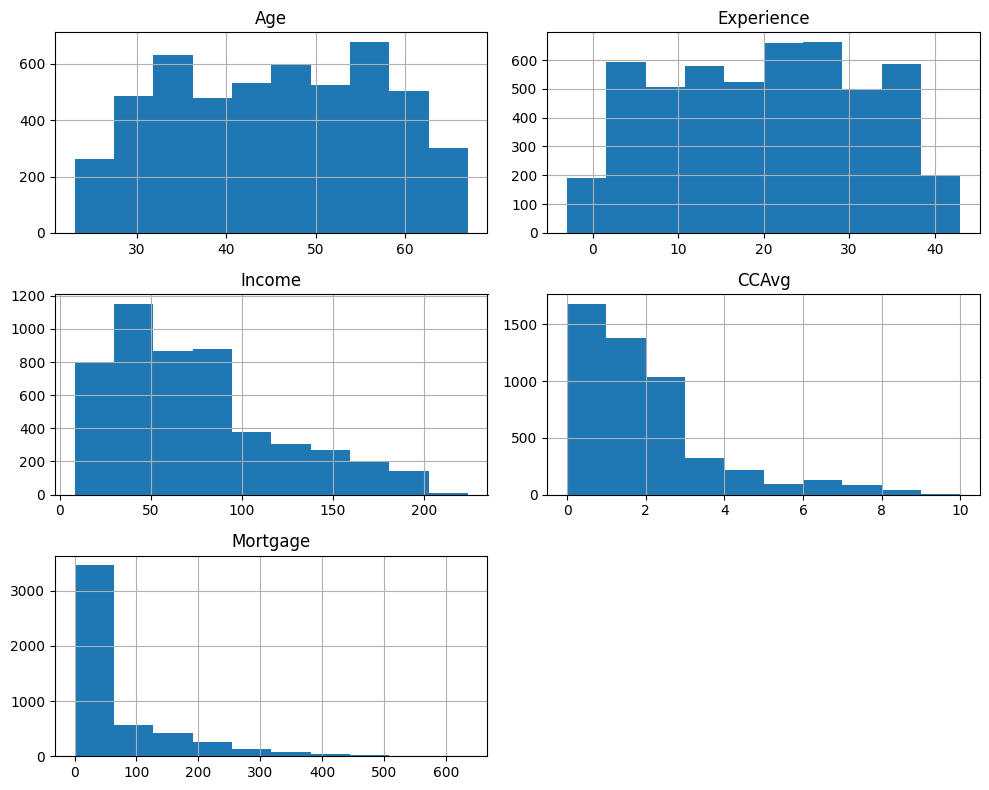


Visualize distribution ofcategorical features: 


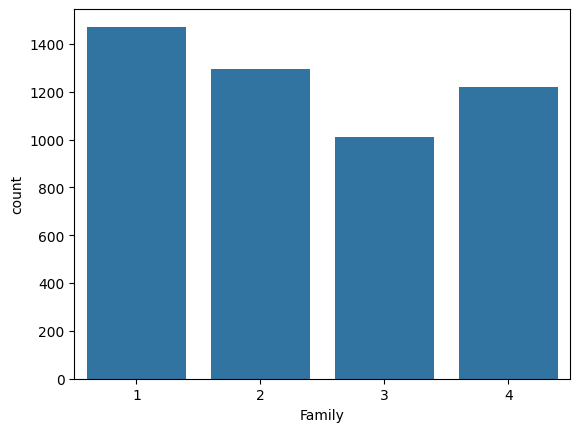

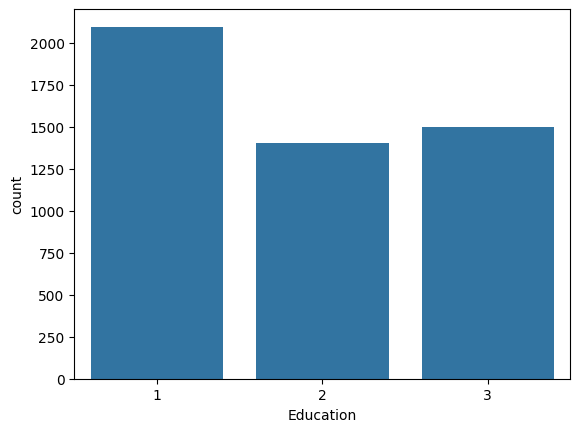

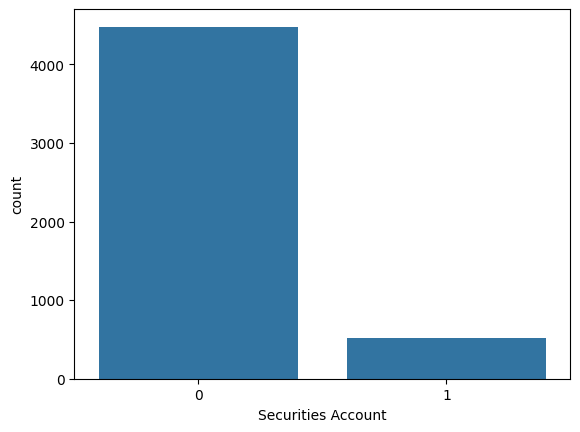

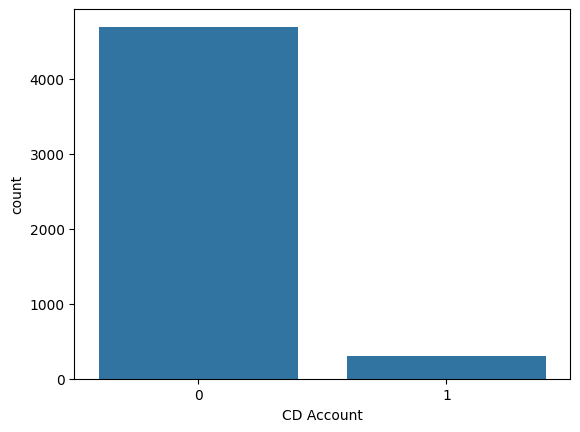

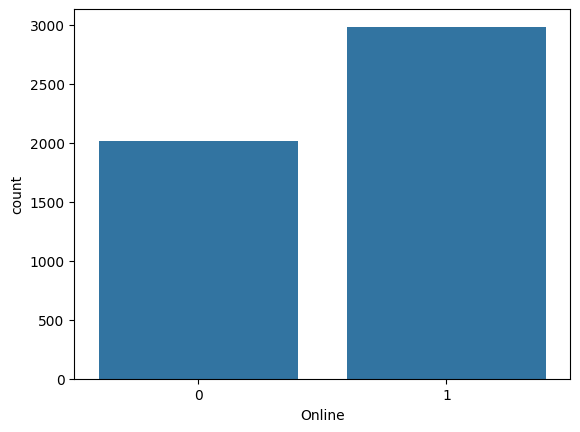

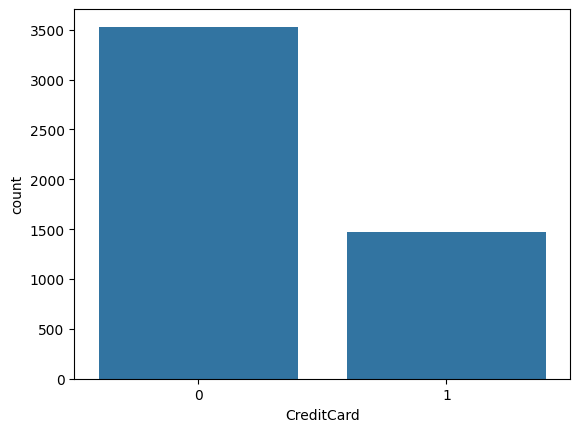


 Other Visualization: 


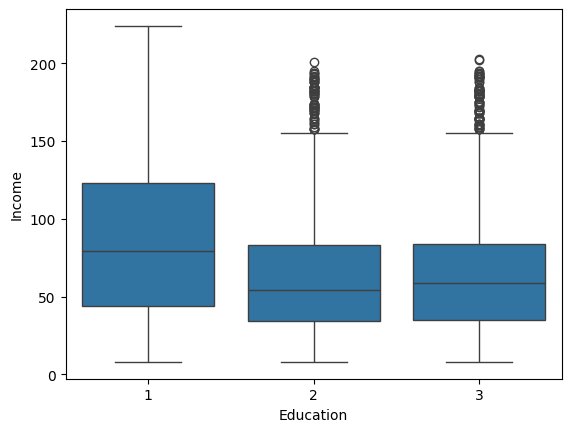

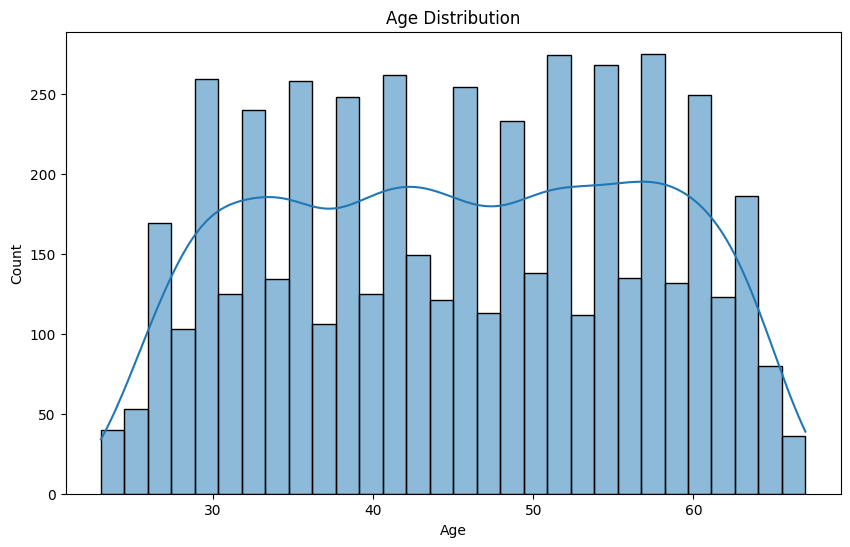


Check normalized features: 
        Age  Experience    Income    Family     CCAvg  Mortgage
0 -1.774417   -1.666078 -0.538229  1.397414 -0.193385 -0.555524
1 -0.029524   -0.096330 -0.864109  0.525991 -0.250611 -0.555524
2 -0.552992   -0.445163 -1.363793 -1.216855 -0.536736 -0.555524
3 -0.901970   -0.968413  0.569765 -1.216855  0.436091 -0.555524
4 -0.901970   -1.055621 -0.625130  1.397414 -0.536736 -0.555524


In [7]:
# Load dataset
df = pd.read_csv('UniversalBank.csv')

# Explore dataset
print('\nExplore dataset: ')
print(df.head())

print('\nExplore dataset: ')
print(df.info())

print('\nStatical distribution of each column in dataset: ')
print(df.describe())


# Visualize distribution of numerical features
print('\nVisualize distribution of numerical features: ')
numerical_features = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']
df[numerical_features].hist(figsize=(10, 8))
plt.tight_layout()
plt.show()


# Visualize distribution of categorical features
print('\nVisualize distribution ofcategorical features: ')
categorical_features = ['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard']
for feature in categorical_features:
    sns.countplot(x=feature, data=df)
    plt.show()

print('\n Other Visualization: ')
# Boxplot income by education
sns.boxplot(x='Education', y='Income', data=df)

plt.figure(figsize=(10, 6))
sns.histplot(x='Age', data=df, bins=30, kde=True)
plt.title('Age Distribution')
plt.show()

# Normalize features
features = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Mortgage']
scaler = StandardScaler()
df[features] = scaler.fit_transform(df[features])

print('\nCheck normalized features: ')
# Check normalized features
print(df[features].head())

# Output as follows:

**Observation:**

* Customer Age and Experience: Customers' average age is roughly 45 years, with a standard variation of about 11.46 years. This suggests that the age distribution is fairly spaced out. The minimum and maximum ages are 23 and 67, respectively. The average job experience is approximately 20 years. However, there is a negative value in the minimal experience, which could be a data entering error and warrants more study.
* Income and Mortgage: Customers' average yearly income is around 73, 774 dollars, with a significant standard deviation, indicating a wide range of earnings. Mortgage values also vary greatly, with 75% of persons having a mortgage worth less than 101,000 dollars and the largest amount being 635,000 dollars.
* Family and Education: Customers typically have two or three family members. The education level is pretty equally distributed, with a mean near 2, corresponding to the 'Master' level on the supplied scale (1: Bachelor, 2: Master, 3: Advanced Degree).
* Banking: Approximately 10% of users have a securities account, 6% have a CD account, and almost 60% use online banking. About 29% of clients have been authorized for a credit card.
* Credit card averages (CCAvg): The average monthly credit card spending is approximately 1,938 dollars. However, the maximum value is $10,000, which is significantly more than the average, indicating the presence of outliers or large spenders.


# Task 2: Using 5 fold cross-validation, implement a multilayer perceptron with no more than 2 hidden layers. Report the training error and cross-validation error.

In [8]:
# Using Keras here to build a simple multilayer perceptron and sklearn for 5-fold cross-validation.

# Prepare data
X = df.drop(['ID', 'ZIP Code', 'CreditCard'], axis=1).values
y = df['CreditCard'].values

# Define 5-fold cross-validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Placeholder for scores and errors
train_scores = []
test_scores = []
train_errors = []
test_errors = []

fold = 1

for train, test in kfold.split(X, y):
    print(f"Current Fold: {fold}")

    # Define model
    model = Sequential([
        Dense(64, input_dim=X.shape[1], activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    # Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit model
    model.fit(X[train], y[train], epochs=50, batch_size=10, verbose=0)

    # Evaluate model on the training set
    train_loss, train_acc = model.evaluate(X[train], y[train], verbose=0)

    # Evaluate model on the testing set
    test_loss, test_acc = model.evaluate(X[test], y[test], verbose=0)

    # Logging scores and errors
    train_scores.append(train_acc * 100)
    test_scores.append(test_acc * 100)
    train_errors.append(train_loss)
    test_errors.append(test_loss)

    # Report fold wise status
    print(f"Fold {fold} - Training Accuracy: {train_acc*100:.2f}%, Training Error: {train_loss:.4f}")
    print(f"Fold {fold} - Testing Accuracy: {test_acc*100:.2f}%, Testing Error: {test_loss:.4f}\n")

    fold +=1

# Reporting consolidated results
print(f"Mean CV Train Accuracy: {np.mean(train_scores):.2f}%, Std: {np.std(train_scores):.2f}%")
print(f"Mean CV Train Error: {np.mean(train_errors):.4f}, Std: {np.std(train_errors):.4f}")
print("\n")
print(f"Mean CV Test Accuracy: {np.mean(test_scores):.2f}%, Std: {np.std(test_scores):.2f}%")
print(f"Mean CV Test Error: {np.mean(test_errors):.4f}, Std: {np.std(test_errors):.4f}")
print("\n")
print("Cross-validation error (1 - mean accuracy):", 1 - np.mean(train_errors+test_errors))

# Output as follows:

Current Fold: 1
Fold 1 - Training Accuracy: 76.17%, Training Error: 0.4758
Fold 1 - Testing Accuracy: 71.60%, Testing Error: 0.6103

Current Fold: 2
Fold 2 - Training Accuracy: 76.17%, Training Error: 0.4809
Fold 2 - Testing Accuracy: 72.40%, Testing Error: 0.5975

Current Fold: 3
Fold 3 - Training Accuracy: 76.78%, Training Error: 0.4775
Fold 3 - Testing Accuracy: 70.10%, Testing Error: 0.6183

Current Fold: 4
Fold 4 - Training Accuracy: 75.50%, Training Error: 0.5077
Fold 4 - Testing Accuracy: 70.40%, Testing Error: 0.5925

Current Fold: 5
Fold 5 - Training Accuracy: 76.45%, Training Error: 0.4754
Fold 5 - Testing Accuracy: 72.80%, Testing Error: 0.5870

Mean CV Train Accuracy: 76.22%, Std: 0.42%
Mean CV Train Error: 0.4835, Std: 0.0123


Mean CV Test Accuracy: 71.46%, Std: 1.07%
Mean CV Test Error: 0.6011, Std: 0.0115


Cross-validation error (1 - mean accuracy): 0.45771393179893494


# Task 3: Apply LIME to explain individual outcomes and select representative explanations

In [9]:
# Select 5 random data points from the dataset
random_indices = random.sample(range(X.shape[0]), 5)
selected_data_points = X[random_indices]

In [10]:
# Initialize LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X,
    feature_names=df.drop(['ID', 'ZIP Code', 'CreditCard'], axis=1).columns,
    class_names=['Not Approved', 'Approved'],
    mode='classification'
)

# Modify prediction function to return probabilities for both classes
def predict_proba(X):
    # Modification ensures output is in shape (n_samples, 2), which LIME expects
    preds = model.predict(X)
    # Convert predictions to have probabilities for both classes
    return np.hstack((1-preds, preds))

print("\n Model's predictions on the random selected 5 data points as follows: ")
# Explaination on model's predictions on the random selected data points
for i, data_point in enumerate(selected_data_points):
    exp = explainer.explain_instance(data_point, predict_proba, num_features=len(data_point))
    print(f"\n Explanation for data point {random_indices[i]}:")
    print(exp.as_list(), "\n")
    exp.show_in_notebook(show_table=True, show_all=False)

print("\n LIME explanations for a subset (10%) of the training data as follows: ")
# Generate LIME explanations for a subset (10%) of the training data
subset_indices = np.random.choice(X.shape[0], size=int(0.1 * X.shape[0]), replace=False)
subset_points = X[subset_indices]

# Store Feature importances
feature_importances = np.zeros(X.shape[1])

# Regular expression pattern to match English alphabetic characters for feature name
pattern = re.compile('[a-zA-Z]+')

print("\n Generate explanations for the subset:----")
# Generate explanations for the subset, but limit detailed analysis to 5
for i, idx in enumerate(subset_indices[:5]):
    exp = explainer.explain_instance(subset_points[i], predict_proba, num_features=X.shape[1])
    print(f"\n Explanation for data point {subset_indices[i]}:")
    exp_map = dict(exp.as_list())
    print(exp.as_list(), "\n")
    for feature, importance in exp_map.items():
        # Find all matches in input string
        matches = pattern.findall(feature)

        # Join matches to form a single string
        english_only = ' '.join(matches)

        feature_idx = df.drop(['ID', 'ZIP Code', 'CreditCard'], axis=1).columns.tolist().index(english_only)
        feature_importances[feature_idx] += np.abs(importance)
    exp.show_in_notebook(show_table=True, show_all=False)

# Identify key features based on their accumulated importance
key_features_indices = np.argsort(-feature_importances)[:5]  # Top 5 features

# Threshold on the mean value of key features for prediction
key_features_mean = np.mean(X[:, key_features_indices], axis=1)
threshold = np.median(key_features_mean)  # Setting threshold at median for binary classification

# Make predictions across the entire training dataset
predictions = (key_features_mean >= threshold).astype(int)

# Calculate classification error
accuracy = accuracy_score(y, predictions)
classification_error = 1 - accuracy

print("\n")
print(f"Classification error using LIME-informed rule: {classification_error:.2f}")

# Output as follows:


 Model's predictions on the random selected 5 data points as follows: 
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

 Explanation for data point 651:
[('CD Account <= 0.00', -0.7098666760602237), ('Securities Account <= 0.00', 0.1721100630843211), ('Personal Loan <= 0.00', 0.13558052094208037), ('Age <= -0.90', -0.06275463885068958), ('Online <= 0.00', 0.057263637615072804), ('Experience <= -0.88', 0.05706893437180475), ('Mortgage > 0.44', -0.04420912156597721), ('-0.71 < CCAvg <= -0.25', 0.03870318635253728), ('Education <= 1.00', 0.02287003570214068), ('-0.35 < Family <= 0.53', 0.008450835597619962), ('-0.76 < Income <= -0.21', -0.007232481301066186)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

 Explanation for data point 3100:
[('CD Account <= 0.00', -0.732201864782436), ('Securities Account <= 0.00', 0.16921226313230456), ('CCAvg > 0.32', -0.12376060055628106), ('Personal Loan <= 0.00', 0.12316623570939103), ('Online <= 0.00', 0.061222721521363176), ('Mortgage <= -0.56', 0.032819216844639225), ('-0.03 < Age <= 0.84', 0.030478147528175965), ('-0.01 < Experience <= 0.86', -0.02358543361930922), ('Family > 0.53', 0.015061407743288199), ('-0.21 < Income <= 0.53', 0.012167456346261365), ('1.00 < Education <= 2.00', -0.009986176447014819)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 1209:
[('CD Account <= 0.00', -0.718783334568743), ('Securities Account <= 0.00', 0.1683314661373342), ('Personal Loan <= 0.00', 0.14125620159280772), ('CCAvg > 0.32', -0.11954821134189487), ('Online <= 0.00', 0.052813802769905584), ('Mortgage > 0.44', -0.031282012996980066), ('-0.03 < Age <= 0.84', 0.016686834921749476), ('-0.01 < Experience <= 0.86', -0.01558916248326855), ('1.00 < Education <= 2.00', -0.005390751300810442), ('-0.35 < Family <= 0.53', 0.0018751355604713037), ('-0.76 < Income <= -0.21', 0.001233514867310807)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 221:
[('CD Account <= 0.00', -0.7164824962294898), ('Securities Account <= 0.00', 0.16802932865485215), ('Personal Loan <= 0.00', 0.13804385410163375), ('0.00 < Online <= 1.00', -0.06215187136415359), ('-0.88 < Experience <= -0.01', 0.03454295049852169), ('Mortgage <= -0.56', 0.02962290924155073), ('-0.90 < Age <= -0.03', -0.029244475756910138), ('-0.25 < CCAvg <= 0.32', 0.012312457794495859), ('-0.21 < Income <= 0.53', 0.01175981992973275), ('-1.22 < Family <= -0.35', -0.01083142034736041), ('1.00 < Education <= 2.00', -0.007353469269798444)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 725:
[('CD Account <= 0.00', -0.7147486963404481), ('Securities Account <= 0.00', 0.16794848804554796), ('Personal Loan <= 0.00', 0.1450854451790161), ('CCAvg > 0.32', -0.13045960752680813), ('Online <= 0.00', 0.056652416386559705), ('Mortgage <= -0.56', 0.03163758897103302), ('-0.88 < Experience <= -0.01', 0.030760690646338566), ('-0.90 < Age <= -0.03', -0.025633308113902374), ('Education <= 1.00', 0.023396518381694903), ('-1.22 < Family <= -0.35', -0.013595445430877696), ('Income > 0.53', 0.008360862912604062)] 




 LIME explanations for a subset (10%) of the training data as follows: 

 Generate explanations for the subset:----
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

 Explanation for data point 4902:
[('CD Account <= 0.00', -0.718208749560898), ('Securities Account <= 0.00', 0.17788448372697943), ('Personal Loan <= 0.00', 0.13703260795970654), ('0.00 < Online <= 1.00', -0.056977622851486213), ('Age <= -0.90', -0.05585597285911669), ('Experience <= -0.88', 0.05462802300581108), ('Education <= 1.00', 0.029576009418884722), ('Mortgage <= -0.56', 0.028634880768792816), ('-1.22 < Family <= -0.35', -0.012989548976664796), ('-0.25 < CCAvg <= 0.32', 0.007322573316353212), ('-0.76 < Income <= -0.21', 0.0016300260787542504)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 780:
[('CD Account <= 0.00', -0.715859711365585), ('Securities Account <= 0.00', 0.17652342277657398), ('Personal Loan <= 0.00', 0.13719352302350693), ('Experience <= -0.88', 0.065527516592673), ('0.00 < Online <= 1.00', -0.06514236415643251), ('Age <= -0.90', -0.05730641321274485), ('-0.71 < CCAvg <= -0.25', 0.047560096611743485), ('Education <= 1.00', 0.040746198351532856), ('Mortgage <= -0.56', 0.033365653546406034), ('Family > 0.53', 0.017959411472118252), ('-0.76 < Income <= -0.21', 0.005718587486109045)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 2502:
[('CD Account <= 0.00', -0.7115816700805848), ('Securities Account <= 0.00', 0.17543017633117233), ('Personal Loan > 0.00', -0.14078381144810972), ('CCAvg > 0.32', -0.12152892954690485), ('Experience > 0.86', -0.07263624975130113), ('Age > 0.84', 0.06943932360996401), ('0.00 < Online <= 1.00', -0.06698626530435486), ('Mortgage <= -0.56', 0.025625422369442326), ('Income > 0.53', 0.016150308717958153), ('1.00 < Education <= 2.00', -0.013636338258828552), ('-1.22 < Family <= -0.35', -0.013015209433489203)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

 Explanation for data point 1607:
[('CD Account <= 0.00', -0.7174221601218829), ('Securities Account <= 0.00', 0.17677435494719348), ('Personal Loan <= 0.00', 0.1463235455466372), ('CCAvg <= -0.71', 0.07055421458487163), ('Online <= 0.00', 0.06123898717114969), ('2.00 < Education <= 3.00', -0.03060042325807438), ('Mortgage <= -0.56', 0.0274534631022115), ('Income <= -0.76', -0.018664623935530686), ('-0.01 < Experience <= 0.86', -0.017143653586814366), ('-0.03 < Age <= 0.84', 0.016752823971443058), ('Family > 0.53', 0.010083165366644753)] 



157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

 Explanation for data point 3342:
[('CD Account <= 0.00', -0.7308162860669799), ('Securities Account <= 0.00', 0.16295605786212572), ('Personal Loan <= 0.00', 0.1280395387101298), ('0.00 < Online <= 1.00', -0.05885768960488187), ('-0.71 < CCAvg <= -0.25', 0.046827233795169156), ('Mortgage > 0.44', -0.03859959621472948), ('-0.88 < Experience <= -0.01', 0.03567769741555185), ('-0.90 < Age <= -0.03', -0.024082556611453265), ('2.00 < Education <= 3.00', -0.02178419695575448), ('-0.21 < Income <= 0.53', 0.008873635748153863), ('-0.35 < Family <= 0.53', 0.007304803132691897)] 





Classification error using LIME-informed rule: 0.49


**Interpretation**


* CD Account: A value less than or equal to 0.00 strongly supports the opposite of the predicted class.
* Securities Account: A value less than or equal to 0.00 somewhat supports the predicted class.
* Personal Loan: A value less than or equal to 0.00 somewhat supports the predicted class.
* Online: A value less than or equal to 0.00 somewhat supports the predicted class.
* Age: A value less than or equal to -0.90 slightly supports the opposite of the predicted class.
* Family: A value between -1.22 and -0.35 slightly supports the opposite of the predicted class.
* Mortgage: A value less than or equal to -0.56 slightly supports the predicted class.
* Experience: A value less than or equal to -0.88 slightly supports the predicted class.
* CCAvg: A value greater than 0.32 slightly supports the opposite of the predicted class.
* Education: A value less than or equal to 1.00 slightly supports the opposite of the predicted class.
* Income: A value greater than 0.53 slightly supports the predicted class.



# Task 4: For the same 5 points selected in Task 3, apply SHAP to explain the same outcomes.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
Shap Force Plot for earlier selected 5 data points: 

 Shap Force plot for data point: 651:


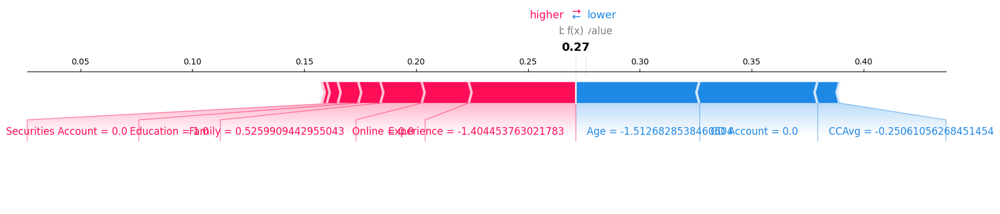


 Shap Force plot for data point: 3100:


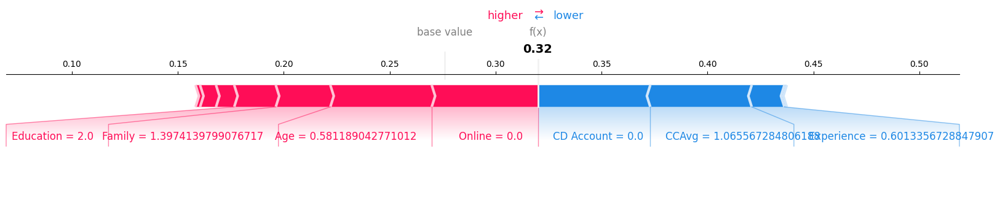


 Shap Force plot for data point: 1209:


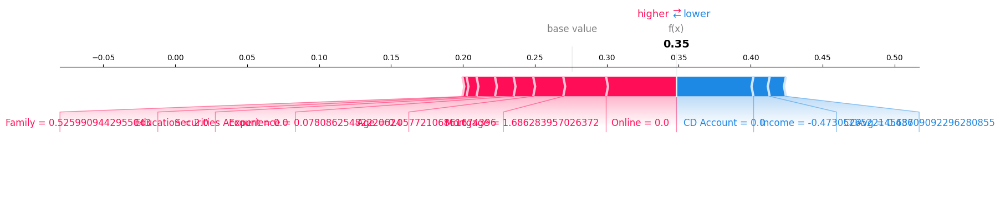


 Shap Force plot for data point: 221:


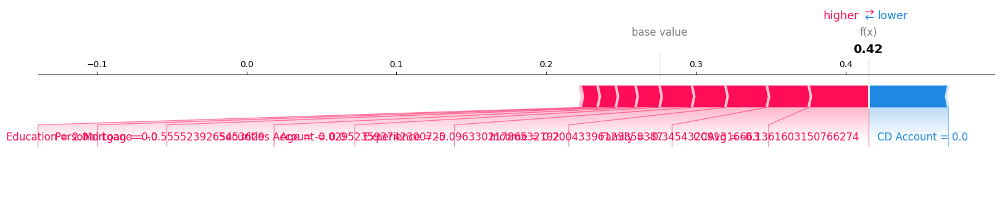


 Shap Force plot for data point: 725:


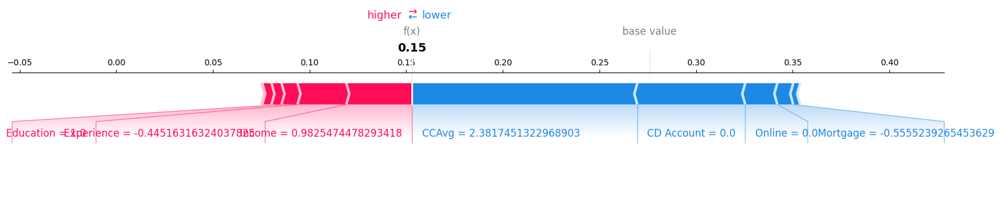

In [11]:
# Shap using force_plot

# Initialize SHAP explainer
# Note: For KernelExplainer, using subset of data (e.g., shap.sample(X, 100)) for performance
# Using model.predict of Keras due to shape of prediction for force_plot
explainer = shap.KernelExplainer(model.predict, shap.sample(X, 100))

# Explain same 5 data points selected earlier for LIME
# Ensure selected_data_points is a 2D array
shap_values = explainer.shap_values(selected_data_points)

# Plot the SHAP values for the selected data points
# Ensure both shap_values and selected_data_points[i] are correctly formatted as 2D arrays
print("Shap Force Plot for earlier selected 5 data points: ")
for i, shap_value in enumerate(shap_values):
    print(f"\n Shap Force plot for data point: {random_indices[i]}:")
    # Reshape the data point and SHAP values
    data_point_reshaped = selected_data_points[i].reshape(1, -1)
    shap_value_reshaped = shap_value.reshape(1, -1)

    shap.force_plot(explainer.expected_value[0], shap_value_reshaped, data_point_reshaped,
                    feature_names=df.drop(['ID', 'ZIP Code', 'CreditCard'], axis=1).columns.tolist(), matplotlib=True)
    plt.show()

# Output as follows:

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6394/6394 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
Shap Summary Plot for earlier selected 5 data points: 


<Figure size 640x480 with 0 Axes>

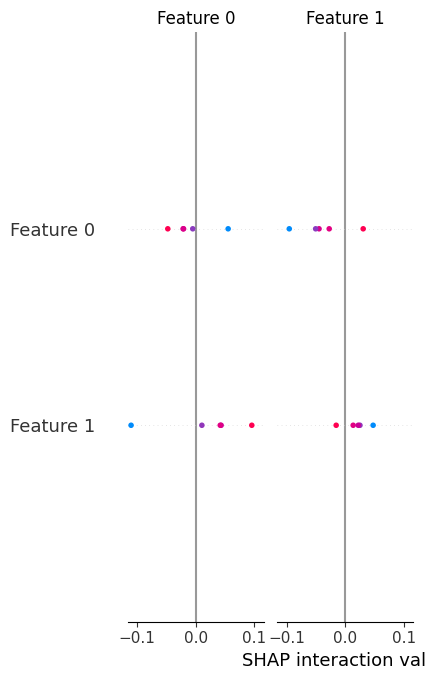

In [12]:
# Shap using summary_plot

# Initialize SHAP explainer
# Note: For KernelExplainer, using subset of data (e.g., shap.sample(X, 100)) for performance
# Using same predict_proba of LIME due to shape of prediction for summary_plot
explainer = shap.KernelExplainer(predict_proba, shap.sample(X, 100))

# Explain same 5 data points selected earlier for LIME
# Ensure selected_data_points is a 2D array
shap_values = explainer.shap_values(selected_data_points)

print("Shap Summary Plot for earlier selected 5 data points: ")
figure = plt.figure()
shap.summary_plot(shap_values, selected_data_points)

# Output as follows:

# Task 5: Share your observations regarding the explanations offered by LIME and SHAP.


* LIME:
  * Offers local explanations, demonstrating how each attribute contributes to prediction for a specific instance.
  * Its simplicity and emphasis on individual predictions may make it more intuitive for non-technical stakeholders.

* SHAP:
  * Provides both local and global explanations, with consistent and theoretically grounded measurements of feature relevance.
  * SHAP values can be aggregated to display the overall impact of features across the dataset, revealing information about the model's behavior.

* Comparative Observations:
  * LIME provides model-agnostic explanations for individual predictions, however explanations may differ based on sampled data.
  * SHAP offers a comprehensive framework for explaining features, both their local impact on individual predictions and their global significance across all forecasts.
  * In reality, SHAP may be favored because to its consistency and capacity to provide both local and global insights, although LIME can be more accessible for short, local explanations, particularly when computational resources are restricted.